# Makie.jl

https://makie.juliaplots.org/stable/

- データ可視化エコシステム
- Plots.jl より新しいパッケージで更新頻度も高い
    - 逆に Plots.jl は成熟しており、より広く知られている
- パフォーマンス・拡張性ともに高く、より簡単な双方向性機能を提供している

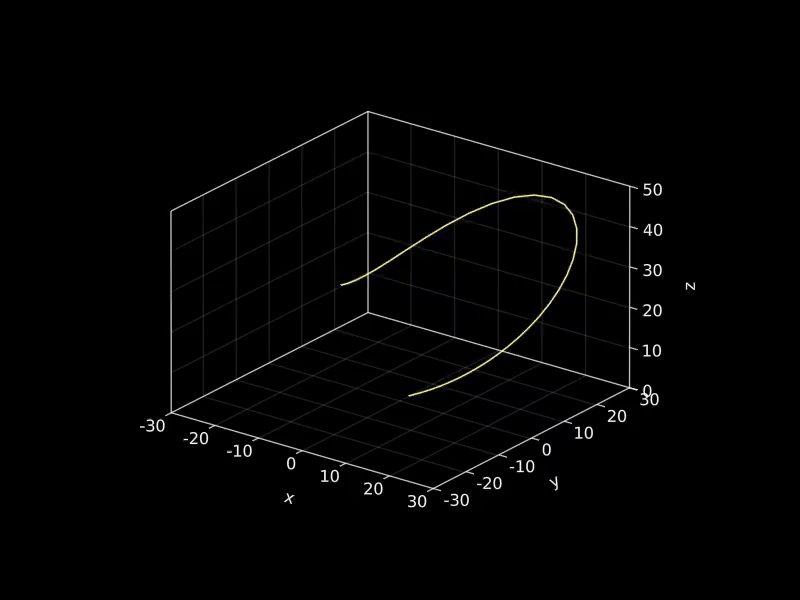

In [3]:
using GLMakie

Base.@kwdef mutable struct Lorenz
    dt::Float64 = 0.01
    σ::Float64 = 10
    ρ::Float64 = 28
    β::Float64 = 8/3
    x::Float64 = 1
    y::Float64 = 1
    z::Float64 = 1
end

function step!(l::Lorenz)
    dx = l.σ * (l.y - l.x)
    dy = l.x * (l.ρ - l.z) - l.y
    dz = l.x * l.y - l.β * l.z
    l.x += l.dt * dx
    l.y += l.dt * dy
    l.z += l.dt * dz
    Point3f(l.x, l.y, l.z)
end

attractor = Lorenz()

points = Observable(Point3f[])
colors = Observable(Int[])

set_theme!(theme_black())

fig, ax, l = lines(
    points, color = colors;
    colormap = :inferno, transparency = true,
    axis = (;
        type = Axis3, protrusions = (0, 0, 0, 0),
        viewmode = :fit, limits = (-30, 30, -30, 30, 0, 50)
    )
)

record(fig, "01-makie-lorenz.gif", 1:120) do frame
    for i in 1:50
        push!(points[], step!(attractor))
        push!(colors[], frame)
    end
    ax.azimuth[] = 1.7pi + 0.3 * sin(2pi * frame / 120)
    notify.((points, colors))
    l.colorrange = (0, frame)
end

display("image/gif", read("01-makie-lorenz.gif"))

## Basic Tutorial

- `Makie.lines(x::Vector, y::Vector)`
    - 線形グラフの描画
- `Makie.scatter(x::Vector, y::Vector)`
    - 散布図の描画

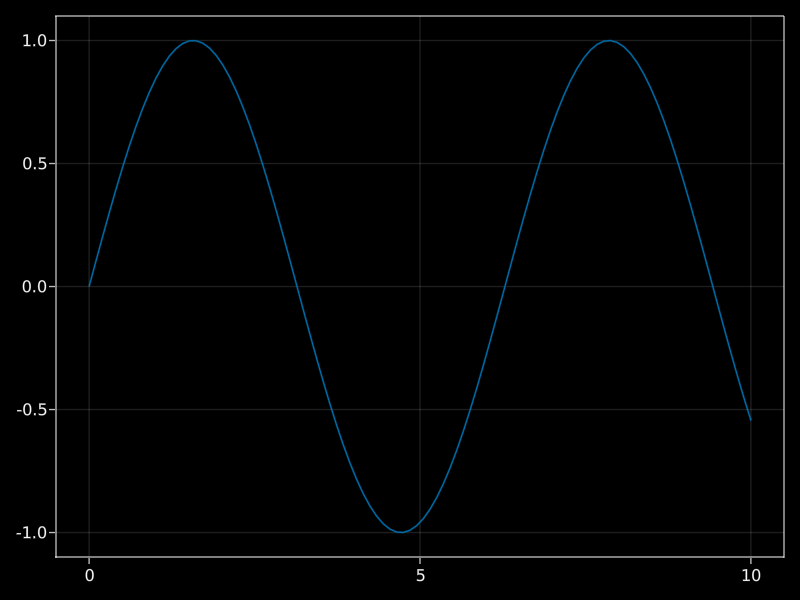

In [4]:
# 正弦波: sine wave
x = range(0, 10, length = 100)
y = sin.(x)

lines(x, y)

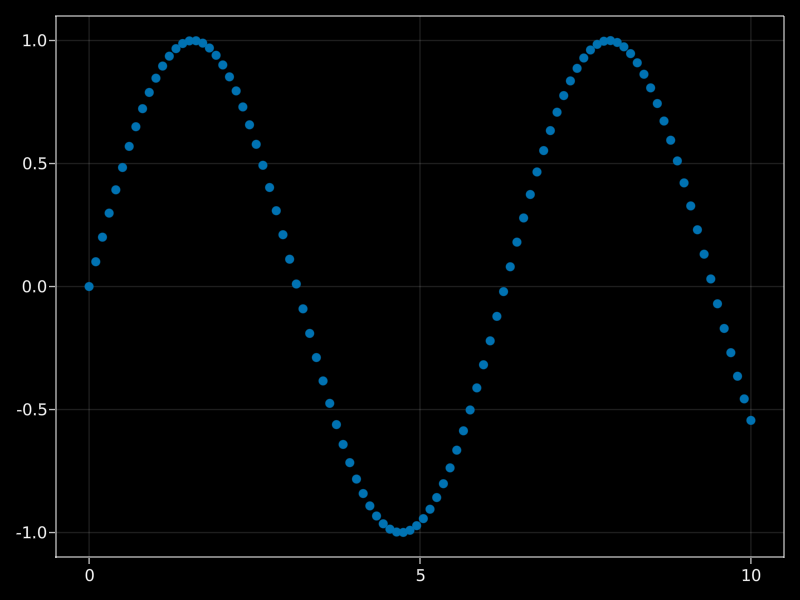

In [5]:
scatter(x, y)

### マルチプロット
Makie の関数を `!` 付きで実行すると、`!` なしで実行したプロット関数の図に重ねてプロッティングすることができる

- 例: `lines!`, `scatter!`, etc

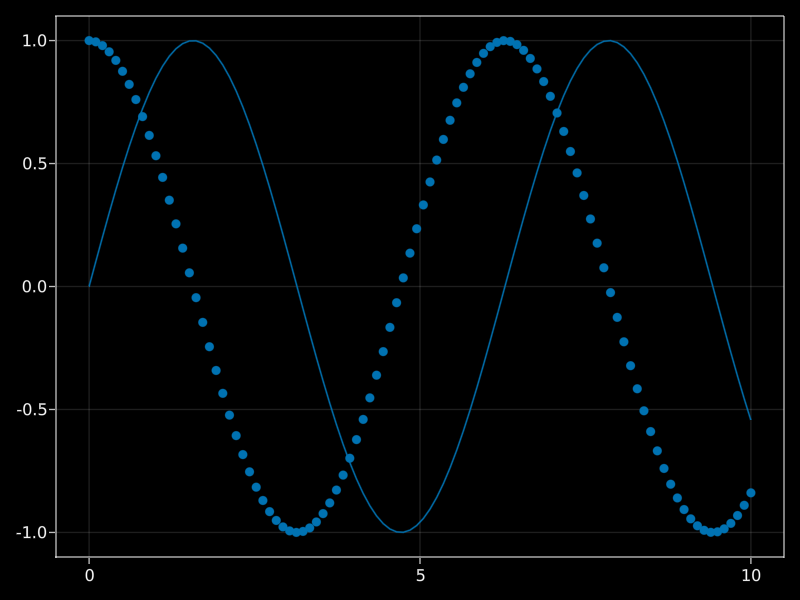

In [6]:
x = range(0, 10, length = 100)

# 正弦波の線形グラフ描画
## `y::Function(x)`: 関数を渡すと、各 x に対して関数を適用した結果を描画できる
lines(x, sin)

# 余弦波の散布図描画: 直前の線形グラフに重ねて描画
scatter!(x, cos)

# 現在のグラフを表示
## 重ねてグラフ描画したときは必ず指定する必要がある
current_figure()

### 属性
各プロッティング関数は、キーワード引数で属性指定することができる

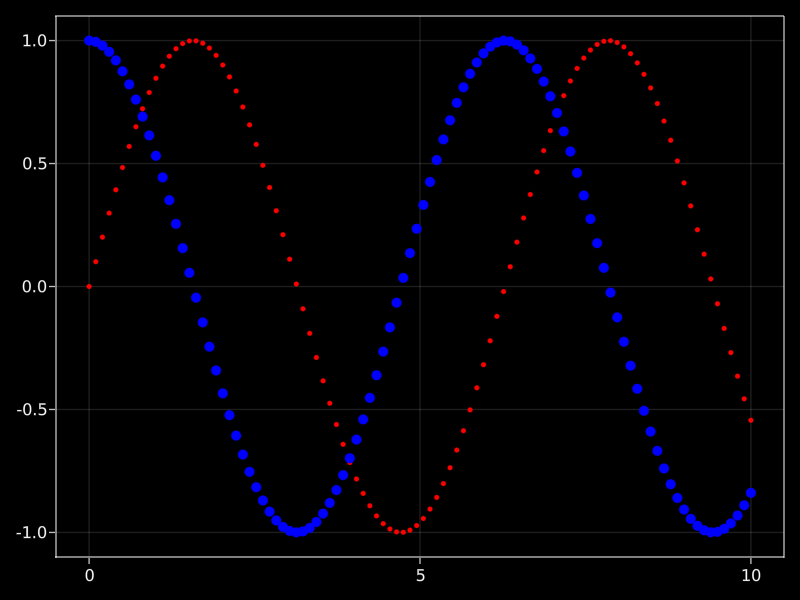

In [9]:
x = range(0, 10, length = 100)

scatter(x, sin, color = :red, markersize = 5)
scatter!(x, cos, color = :blue, markersize = 10)
current_figure()

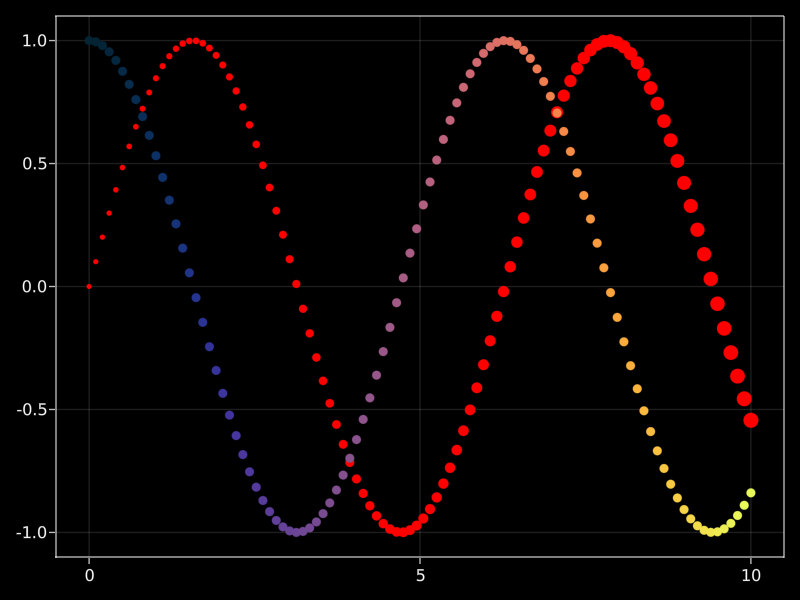

In [10]:
x = range(0, 10, length = 100)

# markersize を 5..15 と徐々に大きくする
scatter(x, sin, color = :red, markersize = range(5, 15, length = 100))

# colormap を :thermal として、color を 0..1 と徐々に彩度を上げる
scatter!(x, cos, colormap = :thermal, color = range(0, 1, length = 100))

current_figure()

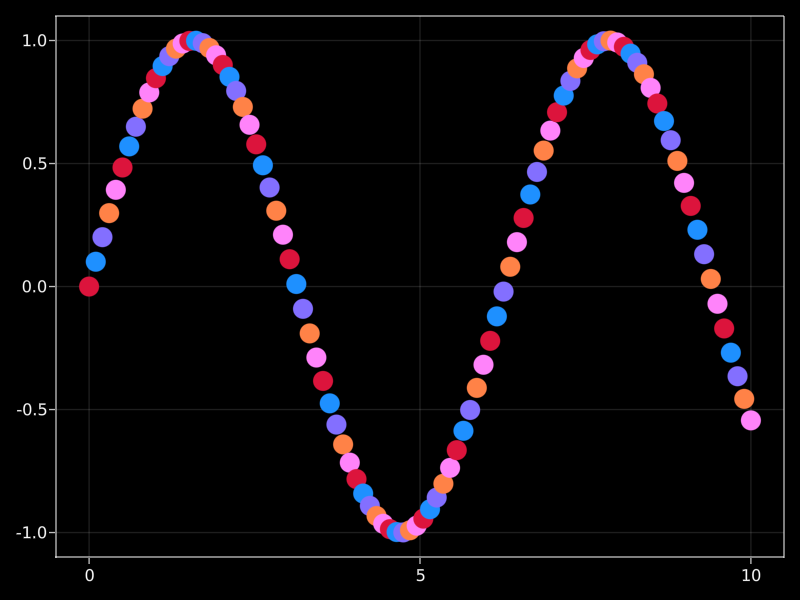

In [11]:
scatter(
    range(0, 10, length = 100),
    sin,
    # Array Attributes の指定は、x データ数と合っていればどのように指定しても良い
    color = repeat([:crimson, :dodgerblue, :slateblue1, :sienna1, :orchid1], 20),
    markersize = 20
)

### 凡例
プロッティング関数のキーワード引数に `label::AbstractString` を指定し `axislegend` 関数を呼び出すことで、すべてのラベリングされたグラフの軸に凡例を表示することができる

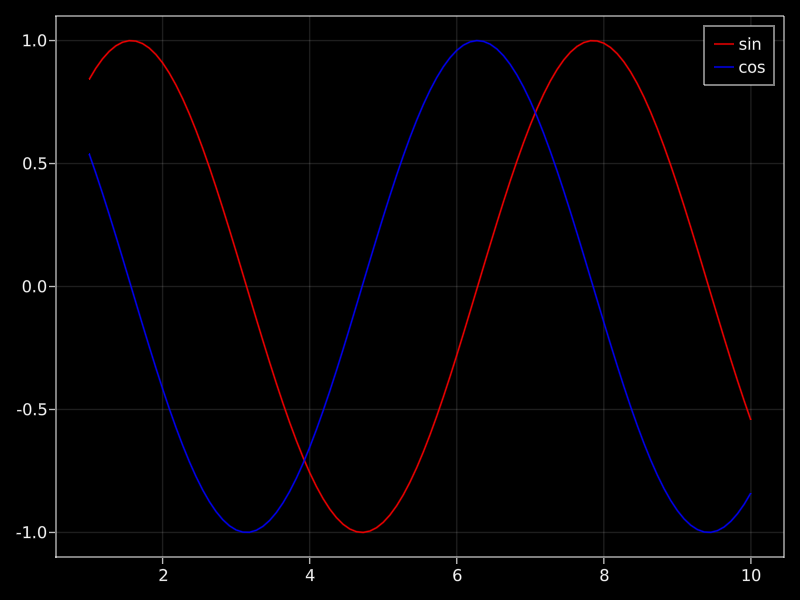

In [14]:
x = range(1, 10, length = 100)

lines(x, sin, color = :red, label = "sin")
lines!(x, cos, color = :blue, label = "cos")
axislegend() # 凡例表示
current_figure()

### Subplots
Makie では複雑なレイアウトの Subplots を作成することができる

最も簡単な方法は `Figure` オブジェクトを使うことである

プロッティング関数の第1引数に `fig[row, col]` (`fig::Figure`) を指定すると、指定グリッド位置にグラフを描画することができる

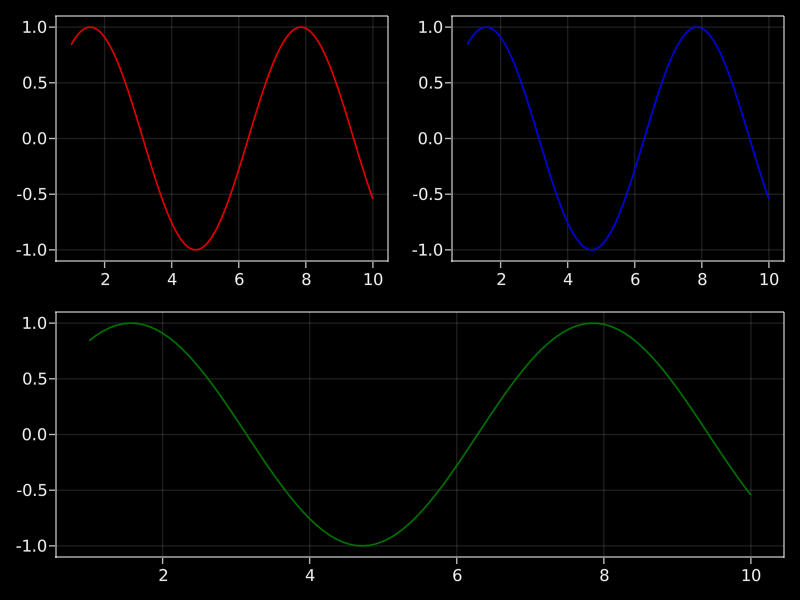

In [15]:
x = range(1, 10, length = 100)
y = sin.(x)

fig = Figure()

# (1, 1) の位置に描画
lines(fig[1, 1], x, y, color = :red)

# (1, 2) の位置に描画
lines(fig[1, 2], x, y, color = :blue)

# (2, 1:2) の位置に描画
lines(fig[2, 1:2], x, y, color = :green)

fig